# EIB Experiment Notebook

## Overview
This notebook demonstrates the complete workflow for the EIB (Example Image Benchmark) experiment. The workflow includes the following steps:

1. **Labels Check & Loading:**  
   Verify the existence of `labels.csv` and load or create labels from images in `../data/training_data`.

2. **Define Custom Configurations:**  
   Set up custom ReLU slopes and training epoch configurations.

3. **Model Training & Evaluation:**  
   - **Model Building:** Construct the CNN model using `build_EIB_cnn(...)` for each custom slope.
   - **Training:** Train the model with block-based splitting (using the first image in every block of 5 for testing) via `train_model(...)`.
   - **Feature Extraction & Correlation:** Extract intermediate features and compute the pairwise correlation matrix.
   - **Results Saving:** Save the correlation matrices and training/validation metrics (accuracy and loss) as JSON files under `../res/EIB/{epoch}/`.

4. **Visualization:**  
   Plot the training/validation curves and the correlation matrix using custom plotting functions.

---


In [ ]:
# In[1] : Imports and Path Settings

import sys
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import pickle
import gc


from tqdm import tqdm
from collections import defaultdict

project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
src_path = os.path.join(project_root, 'src')
sys.path.append(src_path)

# import module from 'src/preprocessing.py'
from preprocessing import load_dataset
from models import build_cnn, train_model
from analysis import (
    compute_correlations,
    visualized_cor_mat
)

from mid_layers import (
    visualize_activations_across_models,
    visualize_grouped_inactive_percentages,
    generate_avg_results_by_model,
)

2025-07-04 01:07:22.205211: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-07-04 01:07:22.348330: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751616442.401989   13535 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751616442.417258   13535 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1751616442.537780   13535 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [2]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))


TensorFlow version: 2.19.0
Num GPUs Available: 1


## 1. Check and (if needed) Create Label CSV
If `../data/labels.csv` is not present, we load images from `../data/training_data/`,
generate the CSV, and store it. Otherwise, we read it and still load images/labels.


In [6]:
# In[2]: Checking/creating label CSV

label_csv_path = '../data/labels.csv'
data_folder = '../data/training_data'   # e.g. ../data/training_data/personA, ../data/training_data/personB, ...
target_size = (128, 128)                # desired image size

if not os.path.exists(label_csv_path):
    print("Label CSV not found. Generating from image folder...")
    df, images_data, labels = load_dataset(data_folder, target_size=target_size)
    df.to_csv(label_csv_path, index=False)
    print(f"Saved new label CSV to {label_csv_path}")
else:
    print("Label CSV found. Reading it now...")
    df = pd.read_csv(label_csv_path)
    print("CSV preview (head):")
    print(df.head())
    # We still need images & labels in memory for training:
    df, images_data, labels = load_dataset(data_folder, target_size=target_size)


dfPerson= pd.read_csv(label_csv_path)
personName = dfPerson.columns[1:].tolist()

print(f"DataFrame shape: {df.shape}")  # Should match labels count
print(f"Image count: {len(images_data)}")  # Should match labels count
print(f"Labels shape: {labels.shape}")  # (N, num_persons)
print(personName)

assert len(images_data) == labels.shape[0], "Mismatch between images and labels!"


Label CSV found. Reading it now...
CSV preview (head):
          img_id  juliana  kim  mai  michael  ntr  park  patrick  pedro  \
0  juliana_0.png        1    0    0        0    0     0        0      0   
1  juliana_1.png        1    0    0        0    0     0        0      0   
2  juliana_2.png        1    0    0        0    0     0        0      0   
3  juliana_3.png        1    0    0        0    0     0        0      0   
4  juliana_4.png        1    0    0        0    0     0        0      0   

   rachel  zen  
0       0    0  
1       0    0  
2       0    0  
3       0    0  
4       0    0  
DataFrame shape: (50, 11)
Image count: 50
Labels shape: (50, 10)
['juliana', 'kim', 'mai', 'michael', 'ntr', 'park', 'patrick', 'pedro', 'rachel', 'zen']


## 2. Define Custom Slopes, Epochs, and Iterations

Change or expand these lists as desired. For each slope in `custom_slope_list`,
we'll train the model for each number of slope in `ep` with `num` loops.


In [7]:
# In[3]: Custom Slopes & Epochs

positive_slope_list = [0.005, 0.05, 0.5]  # Example slopes for custom ReLU
negative_slope_list = [0] #[0, 0.005, 0.05, 0.5]
noise_level = 0 # Example for Internal noise, auto = 0 
ep = 1000        # Example epoch counts
num = 20  # Number of iterations|
threshold_list = [0, 0.0005, 0.005, 0.05] # Example thresholds for custom ReLU
# lr = 0.001  # Learning rate for training




## 3. Main Training Loop

The following code block implements the main training loop. For each iteration and for each custom ReLU slope, the loop:

1. **Clears Previous Metrics:** Resets dictionaries that store correlation matrices and training/validation metrics.
2. **Data Preparation:** Converts the preprocessed images (stored in `images_data`) to a NumPy array.
3. **Model Building:** Constructs a CNN model using the `build_EIB_cnn` function with the current custom slope.
4. **Model Training:** Trains the model using block-based splitting (the first image in every 5 is used for testing) via the `train_model` function.
5. **Metrics Storage:** Stores training and validation accuracy and loss metrics in dictionaries.
6. **Correlation Computation:** Extracts intermediate features using a designated layer and computes the pairwise correlation matrix using `compute_correlations`.
7. **Results Saving:** Converts the correlation matrices and metrics to a JSON-serializable format and saves them as JSON files.
8. **Metrics Plotting:** Visualizes the training and validation curves for accuracy and loss.




In [ ]:
# --- 1. Initialize all data storage dictionaries ---
train_accuracies = defaultdict(list)
train_losses = defaultdict(list)
val_accuracies = defaultdict(list)
val_losses = defaultdict(list)
cor_dict = defaultdict(list) 

trained_model = defaultdict(list)
eib_dict = {}

# --- 2. Prepare dataset and paths ---
data = np.array(list(images_data.values()))
ep_path = f'../res/EIB/{ep}'
model_save_dir = os.path.join(ep_path, 'models')
os.makedirs(ep_path, exist_ok=True)
os.makedirs(model_save_dir, exist_ok=True)

# --- 3. Main training loop ---
for iteration in tqdm(range(num), desc=f'Running {num} Iterations'):
    for th in threshold_list: ### <<< 2. Add the new loop for threshold values
        for s_p in positive_slope_list:
            for s_n in negative_slope_list:
                # ### <<< 3. Update the key to include the threshold
                key = (s_p, s_n, noise_level, th) 
                
                # ### <<< 4. Update filenames to be unique
                model_filename = f"model_iter_{iteration}_sp_{s_p}_sn_{s_n}_th_{th}.keras"
                full_save_path = os.path.join(model_save_dir, model_filename)
                
                print(f"\n---> Running for key (pos, neg, noise, thresh): {key}, Iteration: {iteration+1}/{num}")

                tf.keras.backend.clear_session()

                model = build_cnn(
                    input_shape=(130, 130, 3), 
                    slope_positive=s_p, 
                    slope_negative=s_n,
                    threshold=th, ### <<< 5. Pass the current threshold to the model builder
                    noise_level=noise_level, 
                    filter_size=16, 
                    num_classes=labels.shape[1],
                    learning_rate=0.001, 
                    categorical=True  # Use categorical crossentropy for multi-class classification
                )
                
                trainedAcc_data, trainedLoss_data, validationAcc_data, validationLoss_data = train_model(
                    model, data, df, n_epochs=ep, batch_size=64, verbose=0
                )

                # Store metrics results
                train_losses[key].append(trainedLoss_data)
                train_accuracies[key].append(trainedAcc_data)
                val_losses[key].append(validationLoss_data)
                val_accuracies[key].append(validationAcc_data)

                # --- Correlation Calculation ---
                # ### <<< 6. Update layer_name to match the new format in models.py
                layer_name = f'least2_Dense_sp{s_p}_sn{s_n}_t{th}_n{noise_level}'
                print(f"--- Computing correlations for layer '{layer_name}'... ---")
                c_arr = compute_correlations(images_data, model, layer_name)
                cor_dict[key].append(c_arr)
                # ------------------------------------
                
                print(f"--- Saving model to: {full_save_path} ---")
                model.save(full_save_path)

                print(f"--- Clearing memory for model (key: {key}) ---")
                del model
                del c_arr
                del trainedAcc_data, trainedLoss_data, validationAcc_data, validationLoss_data
                gc.collect()
 


    # --- 4. Save ALL results at the end of EACH iteration ---
    print(f"\n--- Iteration {iteration+1}/{num} complete. Saving results... ---")

    # ADDED: `cor_dict` is now included in the saved data
    results_to_save = {
        'train_accuracies': dict(train_accuracies),
        'train_losses': dict(train_losses),
        'val_accuracies': dict(val_accuracies),
        'val_losses': dict(val_losses),
        'cor_dict': dict(cor_dict) 
    }

    output_filepath = os.path.join(ep_path, f'results_iteration_{iteration}.pkl')
    with open(output_filepath, 'wb') as f:
        pickle.dump(results_to_save, f)
    print(f"✅ Results for iteration {iteration+1} saved to: {output_filepath}")

    # --- 5. Clear ALL dictionaries from memory after saving ---
    print("--- Clearing memory for the next iteration... ---")
    train_accuracies.clear(); train_losses.clear(); val_accuracies.clear(); val_losses.clear(); cor_dict.clear()


print("\n🎉 --- All training iterations completed. All results are saved to disk. --- 🎉")

In [47]:
# ===================================================================
# Cell [5]: Load and Aggregate All Iteration Results from .pkl Files
# ===================================================================
import os
import pickle
import glob
from collections import defaultdict

# --- 1. Configuration ---
# ep_path = f'../res/EIB/{ep}'
ep_path = f'../res/EIB/20_1000_p-original_n-original'
# ep_path = f'../res/EIB/18_1000_p-original_n-0_ths-0_0.0005_0.005_0.05'


# --- 2. Initialize Master Dictionaries ---
train_accuracies = defaultdict(list)
train_losses = defaultdict(list) 
val_accuracies = defaultdict(list)
val_losses = defaultdict(list)
cor_dict = defaultdict(list) # ADDED: For correlation data

# --- 3. Find, Load, and Aggregate Data ---
search_pattern = os.path.join(ep_path, 'results_iteration_*.pkl')
result_files = sorted(glob.glob(search_pattern))

if not result_files:
    print(f"❌ ERROR: No result files found at '{search_pattern}'.")
else:
    print(f"Found {len(result_files)} result file(s) to aggregate.")
    for file_path in result_files:
        print(f"   -> Loading and merging data from: {os.path.basename(file_path)}")
        with open(file_path, 'rb') as f:
            iteration_results = pickle.load(f)
        
        # Merge metrics
        for key, val in iteration_results.get('train_accuracies', {}).items(): train_accuracies[key].extend(val)
        for key, val in iteration_results.get('train_losses', {}).items(): train_losses[key].extend(val)
        for key, val in iteration_results.get('val_accuracies', {}).items(): val_accuracies[key].extend(val)
        for key, val in iteration_results.get('val_losses', {}).items(): val_losses[key].extend(val)
        # ADDED: Merge correlation data
        for key, val in iteration_results.get('cor_dict', {}).items(): cor_dict[key].extend(val)

    print("\n✅ --- All data successfully loaded and aggregated into memory. --- ✅")

Found 20 result file(s) to aggregate.
   -> Loading and merging data from: results_iteration_0.pkl
   -> Loading and merging data from: results_iteration_1.pkl
   -> Loading and merging data from: results_iteration_10.pkl
   -> Loading and merging data from: results_iteration_11.pkl
   -> Loading and merging data from: results_iteration_12.pkl
   -> Loading and merging data from: results_iteration_13.pkl
   -> Loading and merging data from: results_iteration_14.pkl
   -> Loading and merging data from: results_iteration_15.pkl
   -> Loading and merging data from: results_iteration_16.pkl
   -> Loading and merging data from: results_iteration_17.pkl
   -> Loading and merging data from: results_iteration_18.pkl
   -> Loading and merging data from: results_iteration_19.pkl
   -> Loading and merging data from: results_iteration_2.pkl
   -> Loading and merging data from: results_iteration_3.pkl
   -> Loading and merging data from: results_iteration_4.pkl
   -> Loading and merging data from: 

In [48]:
# ===================================================================
# Bar Chart Function (No changes needed, already correct)
# ===================================================================
def plot_accuracy_by_threshold(metrics_dict, title_prefix):
    # ... (此函数无需改动，保持V2/V3版本即可)
    # ... (This function does not need changes, keep the V2/V3 version)
    if not metrics_dict:
        print("Metrics dictionary is empty. Please run the training cell first.")
        return
    records = []
    for key, runs in metrics_dict.items():
        final_metrics = [run[-1] for run in runs if run]
        if not final_metrics:
            continue
        records.append({
            'positive_slope': key[0],
            'negative_slope': key[1],
            'threshold': key[3],
            'mean': np.mean(final_metrics),
            'std': np.std(final_metrics)
        })
    df = pd.DataFrame(records)
    if df.empty:
        print("Could not generate records for bar chart. Check data.")
        return
    unique_positive_slopes = sorted(df['positive_slope'].unique())
    print(f"\n--- Generating Final Performance Bar Charts for: {title_prefix} ---")
    for pos_slope in unique_positive_slopes:
        slope_df = df[df['positive_slope'] == pos_slope].sort_values('threshold')
        if slope_df.empty:
            print(f"No data found for positive slope {pos_slope}. Skipping.")
            continue
        the_only_neg_slope = slope_df['negative_slope'].iloc[0]
        plt.figure(figsize=(12, 7))
        x_positions = range(len(slope_df))
        x_labels = slope_df['threshold']
        plt.bar(
            x=x_positions,
            height=slope_df['mean'],
            yerr=slope_df['std'],
            capsize=5,
            color='steelblue',
            alpha=0.85
        )
        metric_name = title_prefix.split()[-1]
        plt.ylabel(f"Mean Final {metric_name}", fontsize=12)
        plt.xlabel("Threshold", fontsize=12)
        plt.title(
            f"{title_prefix}\n(Positive Slope = {pos_slope}, Negative Slope = {the_only_neg_slope})",
            fontsize=16
        )
        plt.xticks(ticks=x_positions, labels=x_labels)
        if "Accuracy" in title_prefix:
            plt.ylim(0, 1.05)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.tight_layout()
        plt.show()

# ===================================================================
# FINAL: Line/Scatter Plot Function with Raw Data Points + Mean Line
# ===================================================================
def plot_metrics_with_raw_data(metrics_dict, pos_slope, title, ylabel):
    """
    FINAL VERSION:
    1. 为给定的 `pos_slope` 创建一张图。
    2. 图中包含所有 `threshold` 对应的性能曲线。
    3. 对每个 `threshold`:
        a. 将所有重复实验的原始数据点以半透明散点形式绘制。
        b. 在散点之上绘制一条清晰的均值线。
    """
    plt.figure(figsize=(16, 9))

    data_for_plot = {key[3]: val for key, val in metrics_dict.items() if key[0] == pos_slope}

    if not data_for_plot:
        print(f"No data found for positive slope {pos_slope} to plot.")
        return

    try:
        neg_slope_val = next(key[1] for key, val in metrics_dict.items() if key[0] == pos_slope)
    except StopIteration:
        neg_slope_val = "N/A"

    unique_thresholds = sorted(data_for_plot.keys())
    # 修正: plt.cm.get_cmap 已被弃用
    cmap = matplotlib.colormaps.get_cmap('viridis')
    colors = [cmap(i) for i in np.linspace(0, 1, len(unique_thresholds))]


    for i, th in enumerate(unique_thresholds):
        m_list = data_for_plot[th]
        if not m_list: continue

        try:
            min_epochs = min(len(run) for run in m_list if run)
            if min_epochs == 0: continue

            arr = np.array([run[:min_epochs] for run in m_list if run])
            epochs_range = range(min_epochs)

            # 1. 绘制所有原始数据点 (半透明、小尺寸的散点)
            #    循环处理每一次独立的run
            for run_data in arr:
                plt.scatter(epochs_range, run_data, color=colors[i], s=15, alpha=0.2)

            # 2. 计算均值和标准差
            means = arr.mean(axis=0)
            stds = arr.std(axis=0)

            # 3. 绘制均值线 (更粗、不透明的线条)
            plt.plot(
                epochs_range,
                means,
                color=colors[i],
                linewidth=2.5,
                label=f"Mean (Threshold = {th})" # 图例中只显示均值线
            )

            # 4. (可选) 绘制标准差范围，使其更透明
            plt.fill_between(epochs_range, means - stds, means + stds, alpha=0.1, color=colors[i])

        except (ValueError, TypeError) as e:
            print(f"Could not plot data for threshold={th}. Error: {e}")
            continue

    plt.title(f"{title}\n(Positive Slope = {pos_slope}, Negative Slope = {neg_slope_val})", fontsize=18)
    plt.xlabel('Epochs', fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    # 更新图例标题以反映其内容
    plt.legend(title="Mean Performance")
    plt.grid(True, linestyle='--')
    plt.show()


# ===================================================================
# Main Function to Generate All Plot Sets (No changes needed)
# ===================================================================
def generate_all_plots_by_positive_slope(positive_slope_list, val_accuracies, train_accuracies, val_losses, train_losses):
    """
    主调用函数，按 `positive_slope` 来组织所有图表的生成。
    """
    if not val_accuracies:
        print("Result dictionaries are empty. Please run the training cell first.")
        return
    
    for s_p in positive_slope_list:
        print(f"\n\n{'#'*30} VISUALIZATION REPORT FOR POSITIVE SLOPE = {s_p} {'#'*30}")
        
        # 调用最新的绘图函数
        plot_metrics_with_raw_data(train_accuracies, s_p, 'Training Accuracy', 'Accuracy')
        # plot_metrics_with_raw_data(val_accuracies, s_p, 'Validation Accuracy', 'Accuracy')
        # plot_metrics_with_raw_data(train_losses, s_p, 'Training Loss', 'Loss')
        # plot_metrics_with_raw_data(val_losses, s_p, 'Validation Loss', 'Loss')

In [49]:
# --- 最终调用 ---

# 1. 调用新的主函数来生成所有曲线图 (它内部会自动调用 `plot_metrics_with_raw_data`)
generate_all_plots_by_positive_slope(
    positive_slope_list, 
    val_accuracies, 
    train_accuracies, 
    val_losses, 
    train_losses
)

# 2. 调用条形图函数（此函数保持不变）
plot_accuracy_by_threshold(train_accuracies, "Final Training Accuracy")
# plot_accuracy_by_threshold(val_accuracies, "Final Validation Accuracy")



############################## VISUALIZATION REPORT FOR POSITIVE SLOPE = 0.005 ##############################


IndexError: tuple index out of range

<Figure size 1280x720 with 0 Axes>



############################## VISUALIZATION REPORT ##############################


========================= Plot Set for Positive Slope (E) = 0.005 =========================


/tmp/ipykernel_1458/3697424951.py:94: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


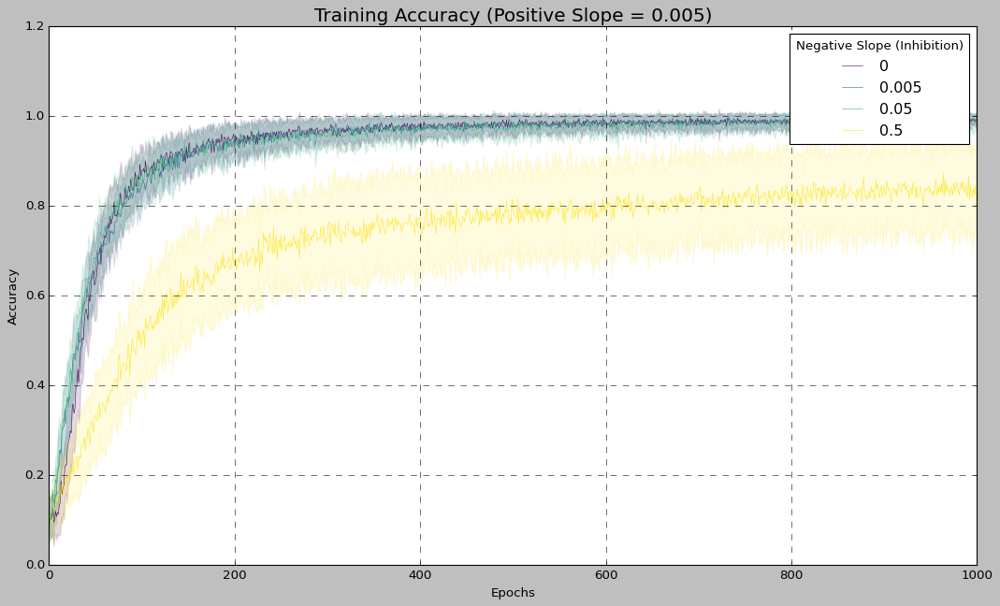



========================= Plot Set for Positive Slope (E) = 0.05 =========================


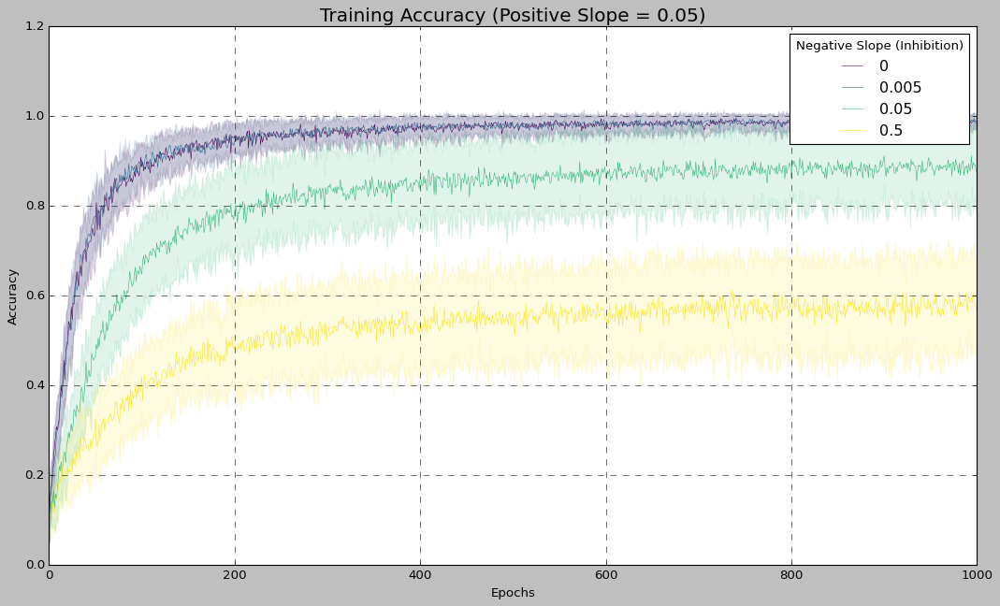



========================= Plot Set for Positive Slope (E) = 0.5 =========================


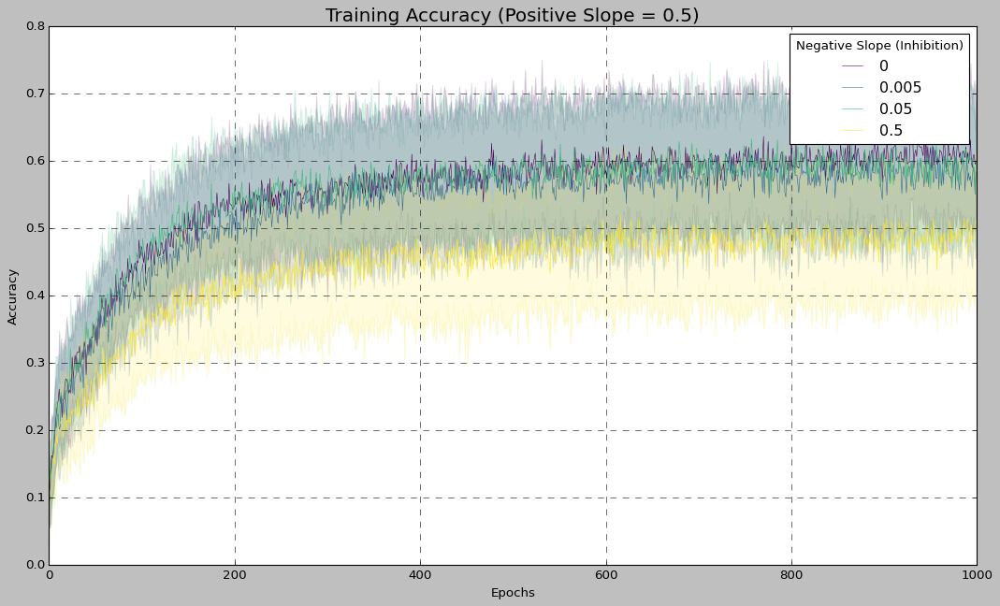


--- Generating Final Performance Bar Charts for: Final Training Accuracy ---


/tmp/ipykernel_1458/3697424951.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


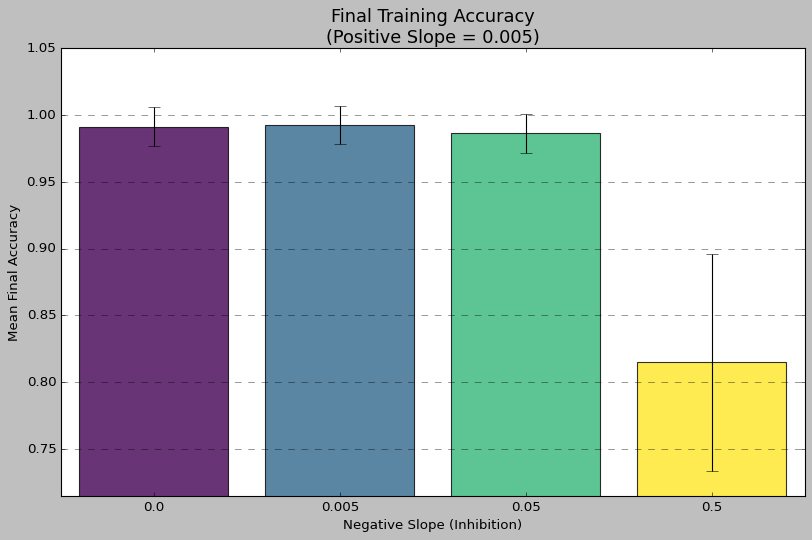

/tmp/ipykernel_1458/3697424951.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


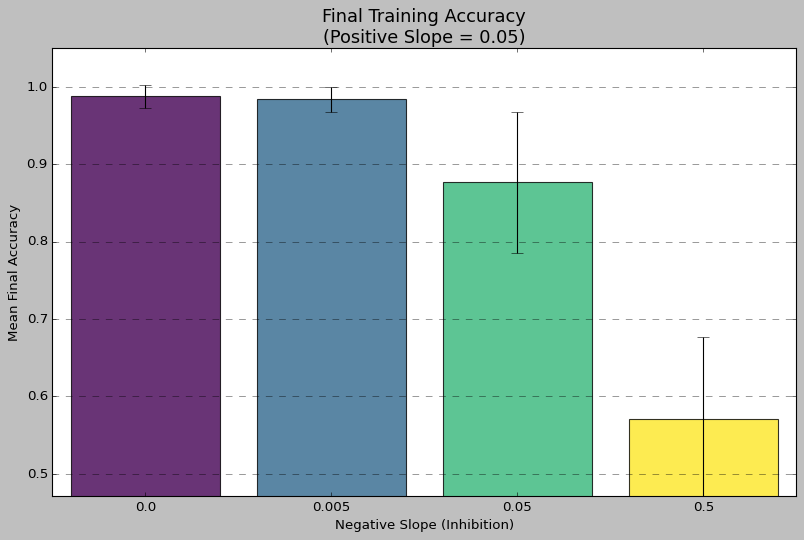

/tmp/ipykernel_1458/3697424951.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


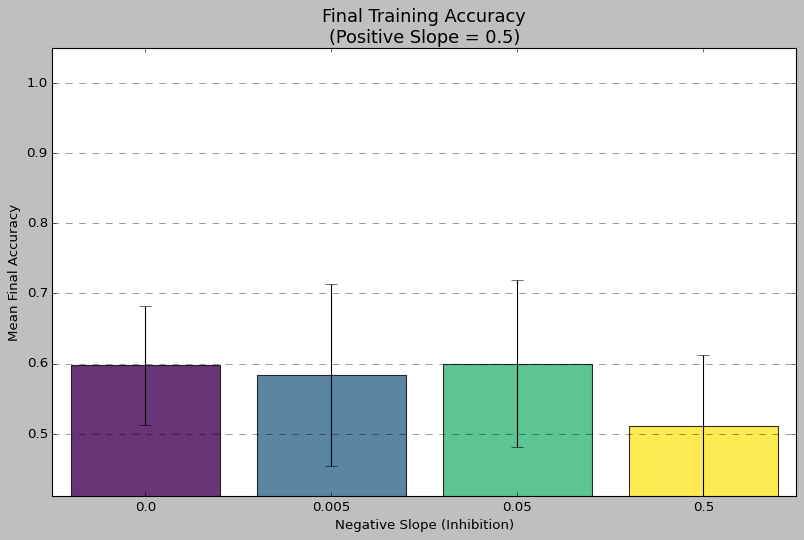

In [50]:
# ===================================================================
# Cell [6]: Analysis and Visualization Functions (REVISED)
# ===================================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def plot_final_accuracy_bar_chart(metrics_dict, title_prefix):
    """
    REVISED: Analyzes final performance and creates a bar plot for each positive_slope.
    """
    if not metrics_dict:
        print("Metrics dictionary is empty. Please run the training cell first.")
        return

    # --- 1. Process the raw results data ---
    records = []
    for key, runs in metrics_dict.items():
        final_metrics = [run[-1] for run in runs if run]
        if not final_metrics:
            continue

        mean_metric = np.mean(final_metrics)
        std_metric = np.std(final_metrics)
        
        # ### <<< REVISED: Unpack the 2-element key ###
        records.append({
            'positive_slope': key[0],
            'negative_slope': key[1],
            'mean': mean_metric,
            'std': std_metric
        })

    df = pd.DataFrame(records)
    if df.empty:
        print("Could not generate records for bar chart. Check data.")
        return

    # --- 2. Generate plots, looping through positive slopes ---
    unique_positive_slopes = sorted(df['positive_slope'].unique())

    print(f"\n--- Generating Final Performance Bar Charts for: {title_prefix} ---")

    for pos_slope in unique_positive_slopes:
        # ### <<< REVISED: Filter only by positive slope ###
        subset_df = df[df['positive_slope'] == pos_slope].sort_values('negative_slope')
        
        if subset_df.empty:
            continue

        plt.figure(figsize=(12, 7))
        # Using a colormap for better visualization
        bar_colors = plt.cm.get_cmap('viridis', len(subset_df))
        
        plt.bar(
            x=range(len(subset_df)),
            height=subset_df['mean'],
            yerr=subset_df['std'],
            capsize=5,
            color=bar_colors.colors,
            alpha=0.8
        )
        
        plt.xticks(ticks=range(len(subset_df)), labels=subset_df['negative_slope'])

        # ### <<< REVISED: Update title to remove threshold ###
        plt.title(f"{title_prefix}\n(Positive Slope = {pos_slope})", fontsize=16)
        plt.xlabel("Negative Slope (Inhibition)", fontsize=12)
        plt.ylabel(f"Mean Final {title_prefix.split()[-1]}", fontsize=12)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        
        if "Accuracy" in title_prefix:
            plt.ylim(max(0, subset_df['mean'].min() - 0.1), 1.05)
            
        plt.show()


def plot_final_metrics(metrics_dict, positive_slope, title, ylabel):
    """
    REVISED: This function now only filters by positive_slope.
    """
    plt.figure(figsize=(16, 9))
    
    # ### <<< REVISED: Filter only by positive_slope ###
    data_for_plot = {
        key[1]: val for key, val in metrics_dict.items() 
        if key[0] == positive_slope
    }

    if not data_for_plot:
        print(f"No data found for positive slope {positive_slope} to plot.")
        return

    colors = plt.cm.get_cmap('viridis', len(data_for_plot))
    sorted_neg_slopes = sorted(data_for_plot.keys())

    for i, neg_slope in enumerate(sorted_neg_slopes):
        m_list = data_for_plot[neg_slope]
        if not m_list: continue

        try:
            min_epochs = min(len(run) for run in m_list if run)
            if min_epochs == 0: continue
            arr = np.array([run[:min_epochs] for run in m_list if run])
            
            means = arr.mean(axis=0)
            stds = arr.std(axis=0)
            epochs_range = range(min_epochs)
            
            plt.plot(epochs_range, means, label=f"{neg_slope}", color=colors(i), linewidth=0.5)
            plt.fill_between(epochs_range, means - stds, means + stds, alpha=0.15, color=colors(i))
        except (ValueError, TypeError) as e:
            print(f"Could not plot data for neg_slope={neg_slope}. Error: {e}")
            continue

    # ### <<< REVISED: Update title to remove threshold ###
    plt.title(f"{title} (Positive Slope = {positive_slope})", fontsize=18)
    plt.xlabel('Epochs', fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.legend(title="Negative Slope (Inhibition)")
    plt.grid(True, linestyle='--')
    plt.show()

# --- Main function to generate all plot sets ---
def generate_all_plots(positive_slope_list, ep):
    """
    REVISED: Generates all plots, creating a separate set for each positive slope.
    """
    if not val_accuracies: # Assuming val_accuracies is a global variable
        print("Result dictionaries are empty. Please run the training cell first.")
        return
    
    # ### <<< REVISED: Removed the outer loop for thresholds ###
    print(f"\n\n{'#'*30} VISUALIZATION REPORT {'#'*30}")
    for s_p in positive_slope_list:
        print(f"\n\n{'='*25} Plot Set for Positive Slope (E) = {s_p} {'='*25}")
        
        # ### <<< REVISED: Removed 'th' from the plotting function calls ###
        plot_final_metrics(train_accuracies, s_p, 'Training Accuracy', 'Accuracy')
        # plot_final_metrics(val_accuracies, s_p, 'Validation Accuracy', 'Accuracy')
        # plot_final_metrics(train_losses, s_p, 'Training Loss', 'Loss')
        # plot_final_metrics(val_losses, s_p, 'Validation Loss', 'Loss')

# --- Run the report generation ---
# Make sure your parameter lists and result dictionaries (e.g., train_accuracies) are defined before this.
# For example:
# positive_slope_list = [0.005, 0.01] 
# ep = 50 
# train_accuracies = {(0.005, 0.1): [[...]], (0.01, 0.2): [[...]]}
# val_accuracies = ...
# train_losses = ...
# val_losses = ...

# ### <<< REVISED: Simplified function call ###
# This single call will produce all your requested charts.
generate_all_plots(positive_slope_list, ep)

# The bar chart function will create plots for each positive slope.
plot_final_accuracy_bar_chart(train_accuracies, "Final Training Accuracy")
# plot_final_accuracy_bar_chart(val_accuracies, "Final Validation Accuracy")

## 3. Visualizing Correlational Matrix


--- Visualizing mean correlation matrix for key: (0.05, 0, 0) ---
Aggregated 20 runs. Mean matrix shape: (50, 50)


/mnt/c/research_thomas/ASD_FaceReg_Modeling_CNN/src/analysis.py:123: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix = hc.linkage(distance_matrix, method='average')


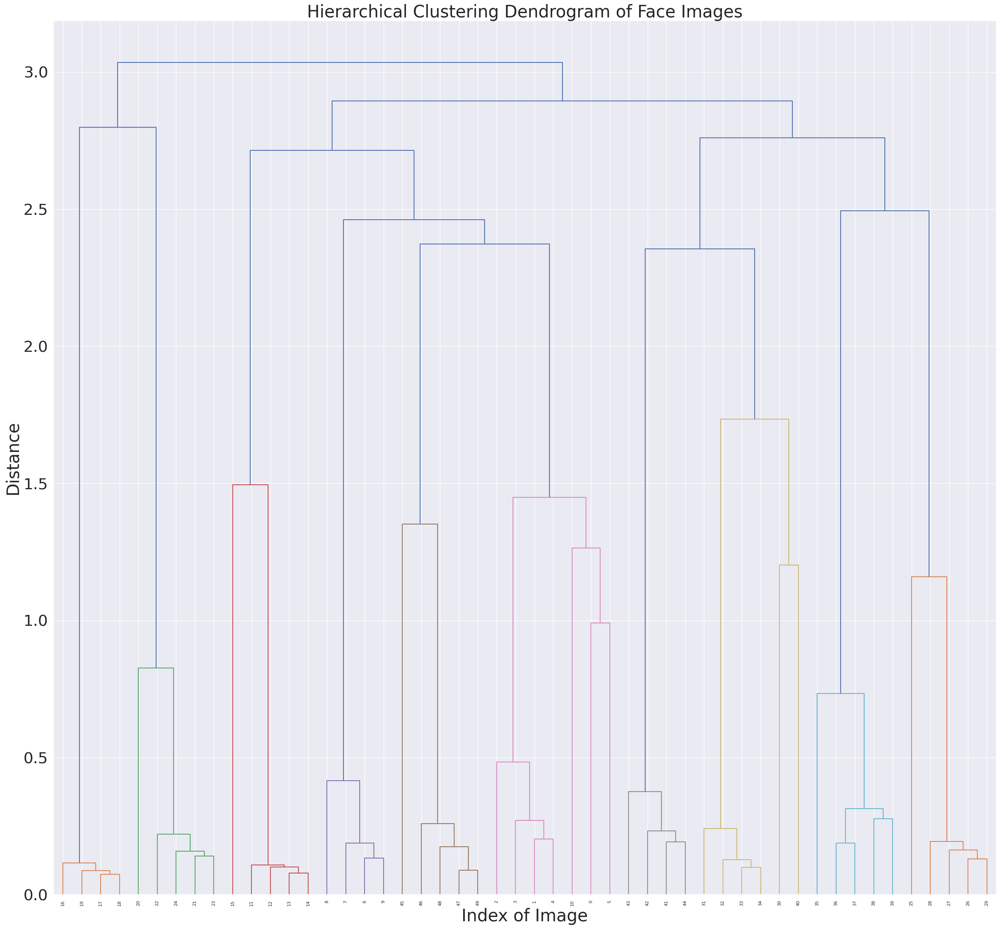

Mean within-person correlation = 0.94549406
Mean out-of-person correlation = -0.010321805


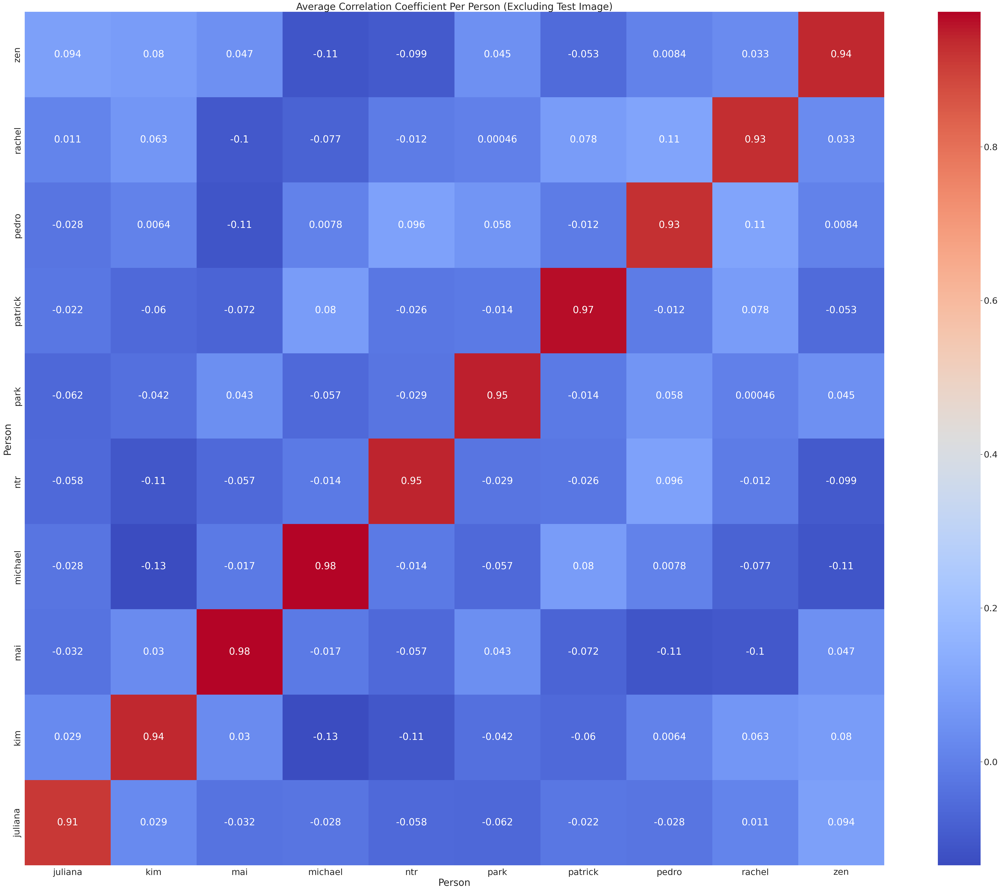

In [7]:

visualized_cor_mat(
    all_cor_data=cor_dict,  # Pass the loaded dictionary
    positive_slope=0.05,
    negative_slope=0,
    noise_level=0,
    label=personName 
)

--- Visualizing mean correlation matrix for key: (0.05, 0.05, 0) ---
Aggregated 13 runs. Mean matrix shape: (50, 50)


/mnt/c/research_thomas/ASD_FaceReg_Modeling_CNN/src/analysis.py:123: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix = hc.linkage(distance_matrix, method='average')


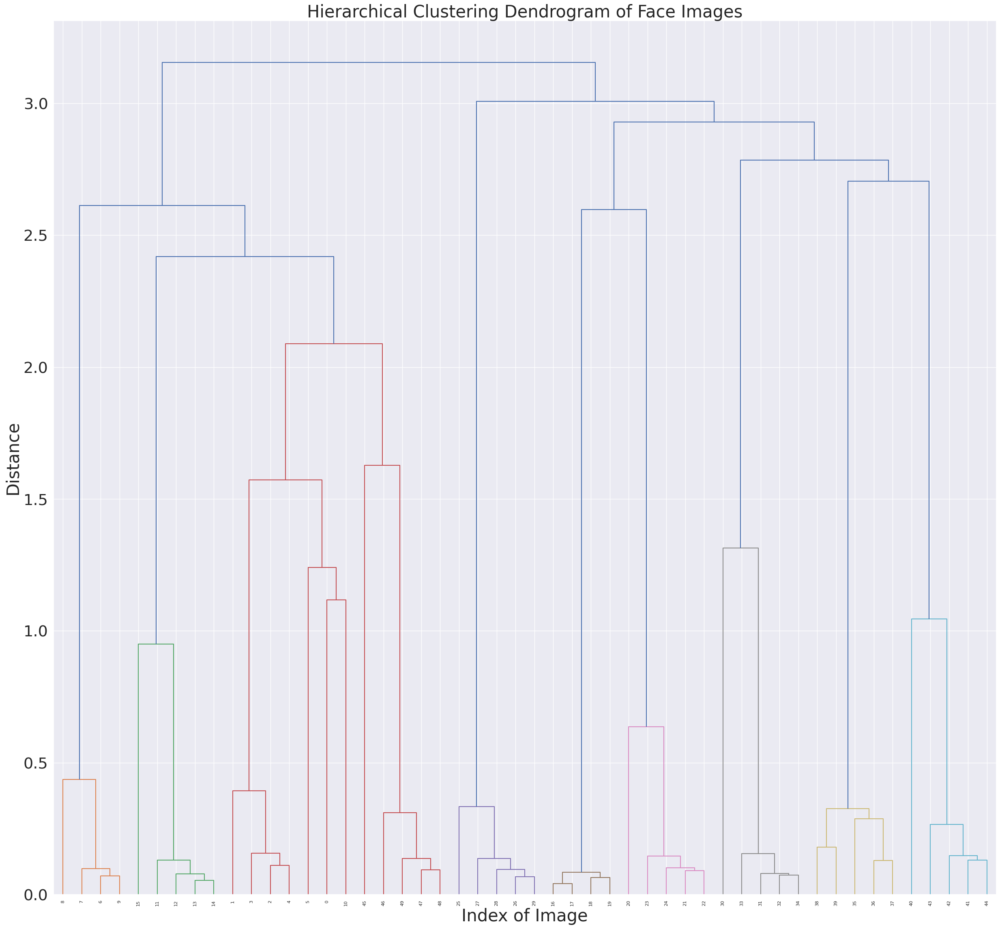

Mean within-person correlation = 0.95996314
Mean out-of-person correlation = -0.015907062


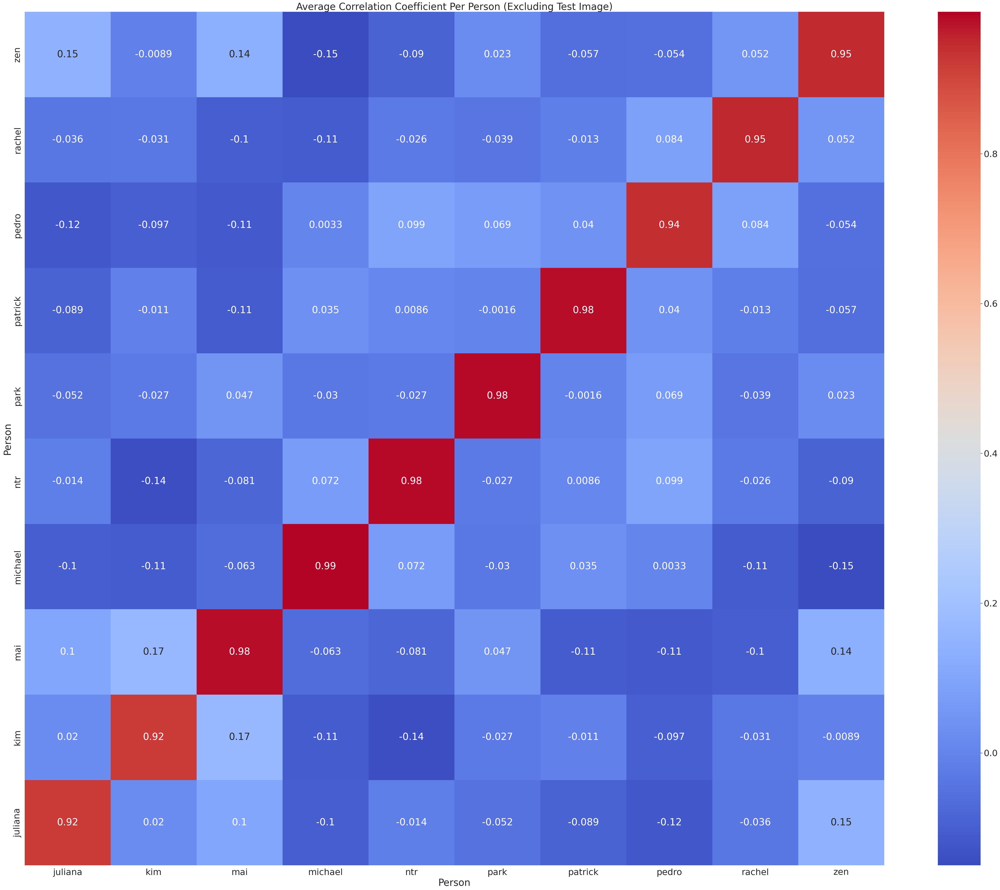

In [14]:

visualized_cor_mat(
    all_cor_data=cor_dict,  # Pass the loaded dictionary
    positive_slope=0.05,
    negative_slope=0.05,
    noise_level=0,
    label=personName 
)



## 4. Extracting and Visualizing Mid_Layer of trained CNN model(inactive_neurons)

In [6]:
relu_layers = [
    'conv_block1_relu', 
    'conv_block2_relu', 
    'conv_block3_relu'
]

layer_names_to_visualize = [
    'conv_block1_conv', 'conv_block1_relu',
    'conv_block2_conv', 'conv_block2_relu',
    'conv_block3_conv', 'conv_block3_relu'
]

cutomized_image_path = "../data/training_data/juliana/juliana_0.png"
target_size = 128
pad_value = 1
cmap = 'viridis' 

avg_results_by_model = generate_avg_results_by_model(trained_model, relu_layers, data_folder, target_size, pad_value)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 261ms/step
Generated results for model key (0.005, 0): {'conv_block1_relu': np.float64(31.206730769230766), 'conv_block2_relu': np.float64(49.64872781065091), 'conv_block3_relu': np.float64(84.03817749023438)}
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 261ms/step
Generated results for model key (0.05, 0): {'conv_block1_relu': np.float64(62.13986686390533), 'conv_block2_relu': np.float64(80.61130177514794), 'conv_block3_relu': np.float64(63.437652587890625)}
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step
Generated results for model key (0.5, 0): {'conv_block1_relu': np.float64(58.61254437869823), 'conv_block2_relu': np.float64(51.92307692307693), 'conv_block3_relu': np.float64(50.790863037109375)}


1/1 ━━━━━━━━━━━━━━━━━━━━ -3s -2599991us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


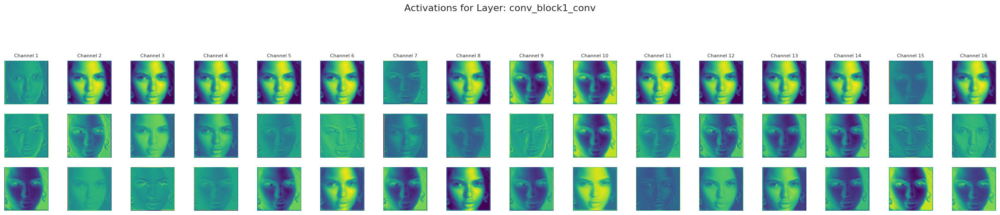

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


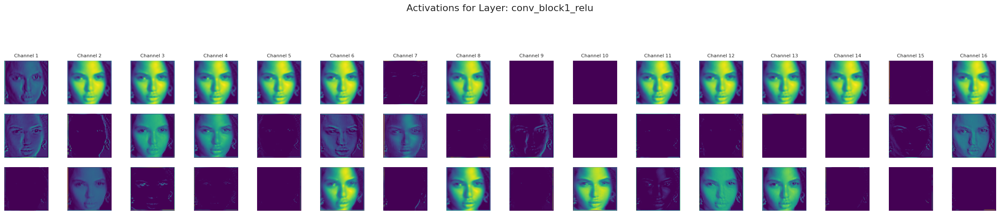

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


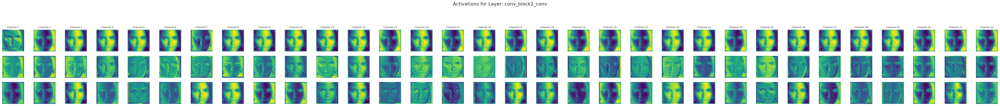

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


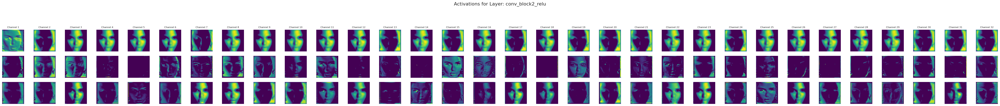

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


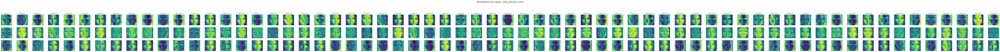

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


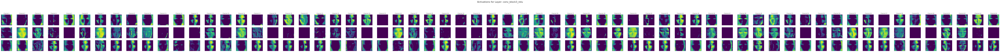

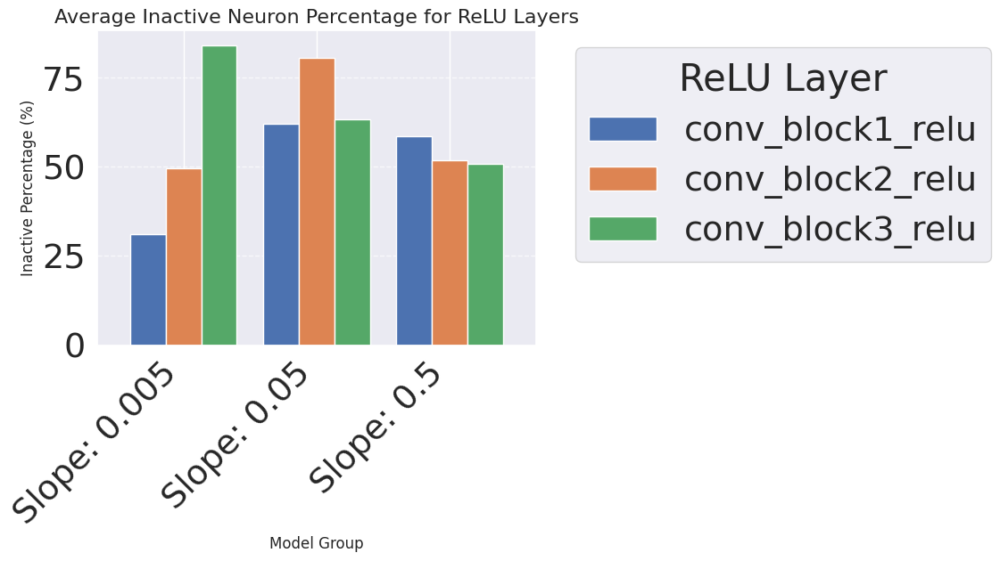

In [7]:

# For each layer, display a composite figure with each row corresponding to a model.
visualize_activations_across_models(trained_model, layer_names_to_visualize, cutomized_image_path, target_size, pad_value, cmap)
visualize_grouped_inactive_percentages(avg_results_by_model, relu_layers, "slope")

